# Cеминар 6: генеративные модели

На этом занятии мы познакомимся с генеративно-состязательными нейронными сетями (GAN). Разберём основную идею GAN и обучим простую DCGAN-модель на синтетическом датасете, имитирующем топологии микросхемы, чтобы в дальнейшем использовать модель для генерации синтетических данных.




## Импорт библиотек

In [ ]:
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader

import numpy as np
import matplotlib.pyplot as plt

from tqdm import tqdm

# Проверяем устройство
DEVICE = "cuda" if torch.cuda.is_available() else "cpu"
print("Using device:", DEVICE)

# Фиксируем seed для воспроизводимости
torch.manual_seed(42)
np.random.seed(42)

Using device: cuda



## Генерация синтетического датасета

Мы не используем реальный GDS, чтобы:
- не усложнять семинар
- не зависеть от внешних файлов

Вместо этого создадим бинарные изображения (64x64),напоминающие полигоны и дорожки микросхем.

In [ ]:
def generate_microstructure():
    """
    Генерирует одно бинарное изображение,
    имитирующее простую топологию микросхемы.
    """
    img = np.zeros((IMAGE_SIZE, IMAGE_SIZE), dtype=np.float32)

    # Случайные прямоугольники ("полигоны")
    num_rects = np.random.randint(1, 5)
    for _ in range(num_rects):
        x1, y1 = np.random.randint(0, IMAGE_SIZE // 2, size=2)
        x2, y2 = np.random.randint(IMAGE_SIZE // 2, IMAGE_SIZE, size=2)
        img[y1:y2, x1:x2] = 1.0

    # Случайные горизонтальные или вертикальные дорожки
    if np.random.rand() > 0.5:
        y = np.random.randint(0, IMAGE_SIZE)
        img[y:y+2, :] = 1.0
    else:
        x = np.random.randint(0, IMAGE_SIZE)
        img[:, x:x+2] = 1.0

    return img

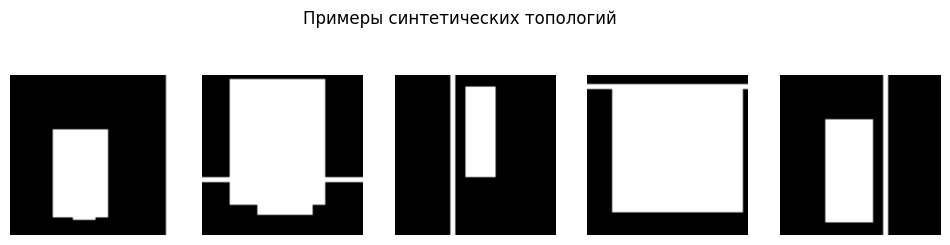

In [ ]:
# Генерируем небольшой датасет
NUM_SAMPLES = 4000
IMAGE_SIZE = 64

data = np.stack([generate_microstructure() for _ in range(NUM_SAMPLES)])

# Нормируем в диапазон [-1, 1], как принято в DCGAN
data = data * 2.0 - 1.0

# Визуализируем несколько примеров
fig, axes = plt.subplots(1, 5, figsize=(12, 3))
for i in range(5):
    axes[i].imshow(data[i], cmap="gray")
    axes[i].axis("off")
plt.suptitle("Примеры синтетических топологий")
plt.show()

## Dataset и Dataloader

In [ ]:
class MicroDataset(Dataset):
    def __init__(self, images):
        self.images = images

    def __len__(self):
        return len(self.images)

    def __getitem__(self, idx):
        img = self.images[idx]
        # Добавляем размерность канала: (1, H, W)
        return torch.tensor(img).unsqueeze(0)


dataset = MicroDataset(data)
dataloader = DataLoader(dataset, batch_size=64, shuffle=True)

## Архитектура генератора и дискриминатора

In [ ]:
LATENT_DIM = 100


class Generator(nn.Module):
    def __init__(self):
        super().__init__()
        self.net = nn.Sequential(

            # z-> 4x4
            nn.ConvTranspose2d(LATENT_DIM, 512, 4, 1, 0, bias=False),
            nn.BatchNorm2d(512),
            nn.ReLU(True),

            # 4x4 -> 8x8
            nn.ConvTranspose2d(512, 256, 4, 2, 1, bias=False),
            nn.BatchNorm2d(256),
            nn.ReLU(True),

            # 8x8 -> 16x16
            nn.ConvTranspose2d(256, 128, 4, 2, 1, bias=False),
            nn.BatchNorm2d(128),
            nn.ReLU(True),

            # 16x16 -> 32x32
            nn.ConvTranspose2d(128, 64, 4, 2, 1, bias=False),
            nn.BatchNorm2d(64),
            nn.ReLU(True),

            # 32x32 -> 64x64
            nn.ConvTranspose2d(64, 1, 4, 2, 1, bias=False),
            nn.Tanh()
        )

    def forward(self, z):
        return self.net(z)


class Discriminator(nn.Module):
    def __init__(self):
        super().__init__()
        self.net = nn.Sequential(
            # 64x64 -> 32x32
            nn.Conv2d(1, 64, 4, 2, 1, bias=False),
            nn.LeakyReLU(0.2, inplace=True),

            # 32x32 -> 16x16
            nn.Conv2d(64, 128, 4, 2, 1, bias=False),
            nn.BatchNorm2d(128),
            nn.LeakyReLU(0.2, inplace=True),

            # 16x16 -> 8x8
            nn.Conv2d(128, 256, 4, 2, 1, bias=False),
            nn.BatchNorm2d(256),
            nn.LeakyReLU(0.2, inplace=True),

            # 8x8 -> 4x4
            nn.Conv2d(256, 512, 4, 2, 1, bias=False),
            nn.BatchNorm2d(512),
            nn.LeakyReLU(0.2, inplace=True),

            # 4x4 -> 1x1
            nn.Conv2d(512, 1, 4, 1, 0, bias=False),
            nn.Sigmoid()
        )

    def forward(self, x):
        return self.net(x).view(-1, 1)


G = Generator().to(DEVICE)
D = Discriminator().to(DEVICE)

In [ ]:
x = torch.randn(64, 1, 64, 64).to(DEVICE)
y = D(x)
print(y.shape)

torch.Size([64, 1])


In [ ]:
z = torch.randn(4, LATENT_DIM, 1, 1).to(DEVICE)
fake = G(z)
print(f"G output: {fake.shape}")
pred = D(fake)
print(f"D output:{pred.shape}")

G output: torch.Size([4, 1, 64, 64])
D output:torch.Size([4, 1])


## Функции потерь и оптимизаторы

In [ ]:
criterion = nn.BCELoss()

optimizer_G = optim.Adam(G.parameters(), lr=2e-4, betas=(0.5, 0.999))
optimizer_D = optim.Adam(D.parameters(), lr=2e-4, betas=(0.5, 0.999))

## Обучение

Epoch 1/40: 100%|██████████| 63/63 [00:04<00:00, 13.83it/s, loss_D=0.011, loss_G=7.88]


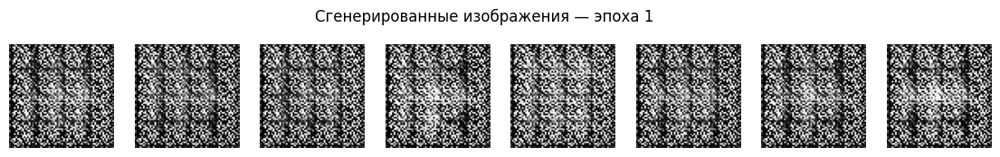

Epoch 2/40: 100%|██████████| 63/63 [00:04<00:00, 14.96it/s, loss_D=0.00688, loss_G=8.01]


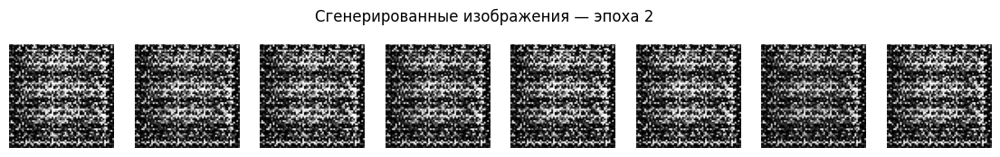

Epoch 3/40: 100%|██████████| 63/63 [00:04<00:00, 14.98it/s, loss_D=0.704, loss_G=11]


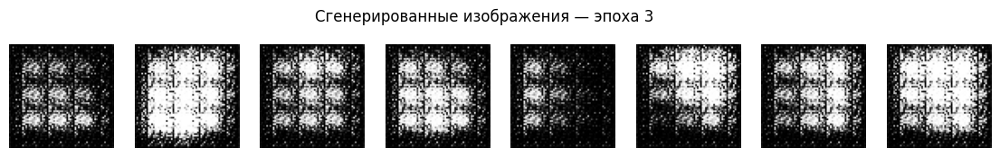

Epoch 4/40: 100%|██████████| 63/63 [00:04<00:00, 14.90it/s, loss_D=0.766, loss_G=5.59]


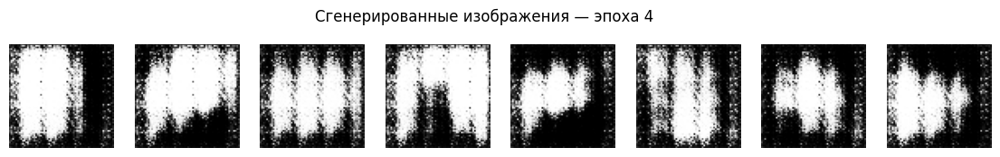

Epoch 5/40: 100%|██████████| 63/63 [00:04<00:00, 14.73it/s, loss_D=0.306, loss_G=6.25]


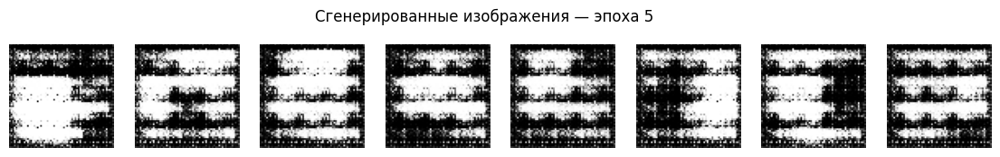

Epoch 6/40: 100%|██████████| 63/63 [00:04<00:00, 14.75it/s, loss_D=0.0453, loss_G=6.6]


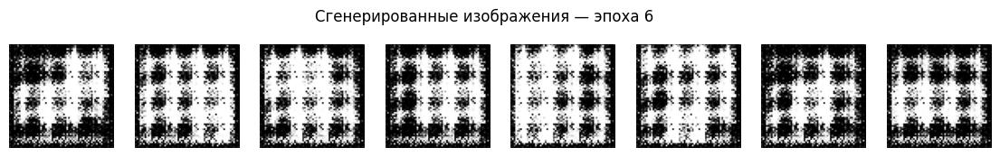

Epoch 7/40: 100%|██████████| 63/63 [00:04<00:00, 14.33it/s, loss_D=0.259, loss_G=3.07]


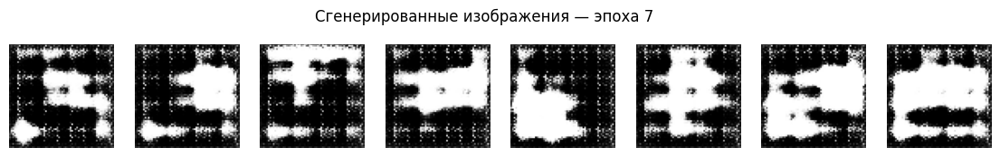

Epoch 8/40: 100%|██████████| 63/63 [00:04<00:00, 14.56it/s, loss_D=0.0959, loss_G=12.6]


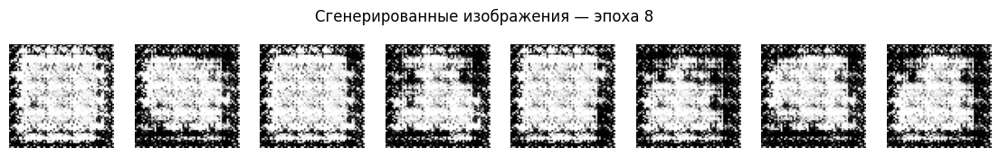

Epoch 9/40: 100%|██████████| 63/63 [00:04<00:00, 14.56it/s, loss_D=0.544, loss_G=1.13]


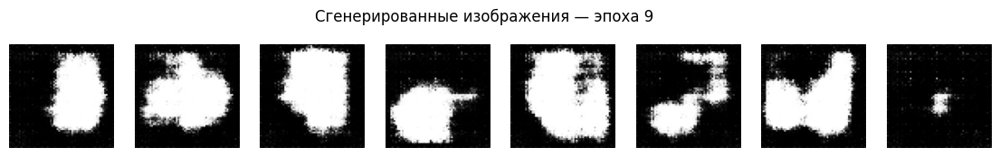

Epoch 10/40: 100%|██████████| 63/63 [00:04<00:00, 14.42it/s, loss_D=6.36, loss_G=5.73]


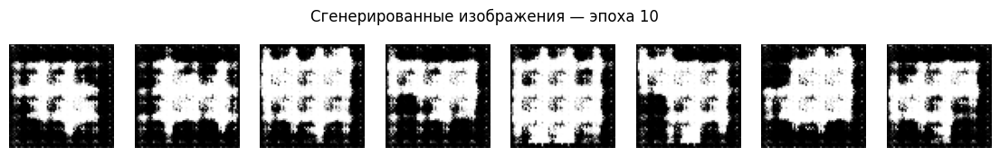

Epoch 11/40: 100%|██████████| 63/63 [00:04<00:00, 14.25it/s, loss_D=0.501, loss_G=2.05]


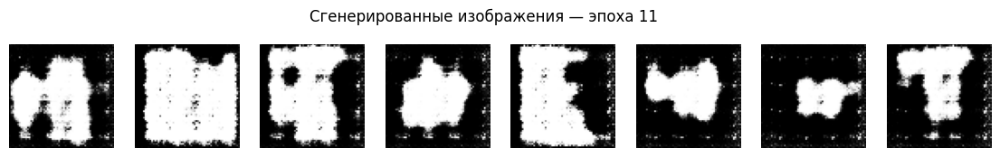

Epoch 12/40: 100%|██████████| 63/63 [00:04<00:00, 14.30it/s, loss_D=0.741, loss_G=2.13]


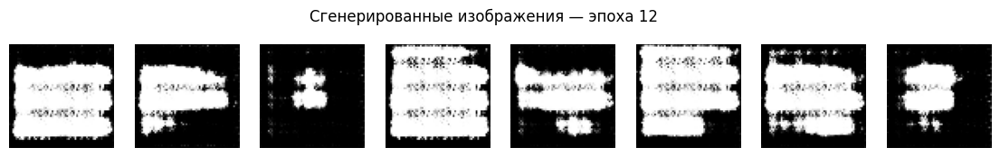

Epoch 13/40: 100%|██████████| 63/63 [00:04<00:00, 14.27it/s, loss_D=0.283, loss_G=2.46]


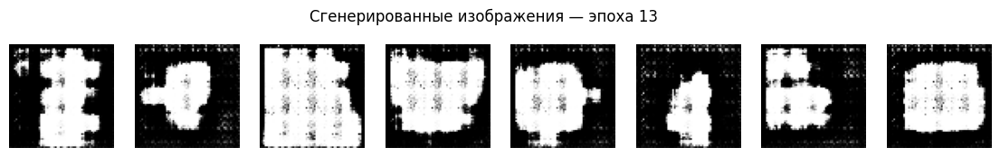

Epoch 14/40: 100%|██████████| 63/63 [00:04<00:00, 13.97it/s, loss_D=0.177, loss_G=4.95]


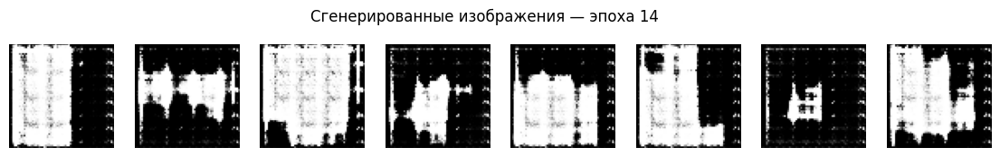

Epoch 15/40: 100%|██████████| 63/63 [00:04<00:00, 14.32it/s, loss_D=2.15, loss_G=15.3]


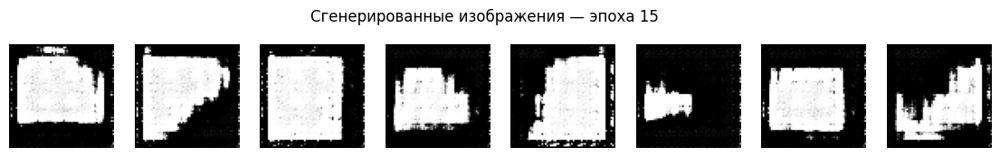

Epoch 16/40: 100%|██████████| 63/63 [00:04<00:00, 14.14it/s, loss_D=0.0576, loss_G=5.13]


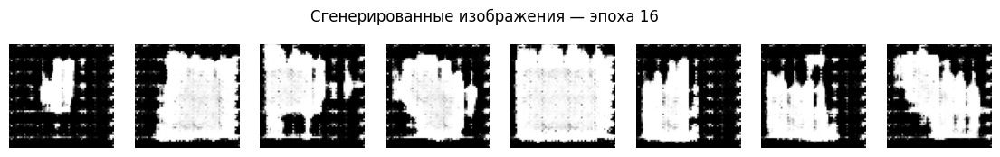

Epoch 17/40: 100%|██████████| 63/63 [00:04<00:00, 14.43it/s, loss_D=0.315, loss_G=1.93]


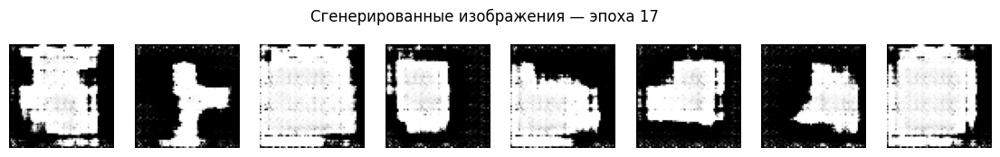

Epoch 18/40: 100%|██████████| 63/63 [00:04<00:00, 14.07it/s, loss_D=0.0882, loss_G=4.77]


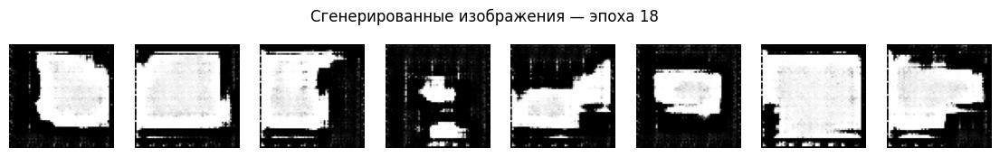

Epoch 19/40: 100%|██████████| 63/63 [00:04<00:00, 14.58it/s, loss_D=0.0117, loss_G=5.87]


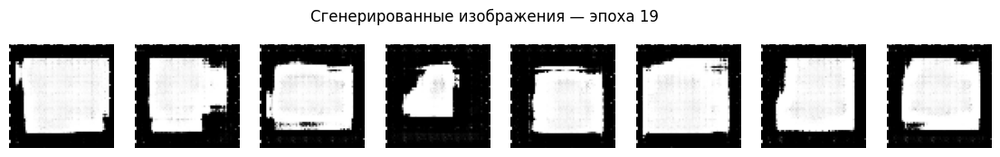

Epoch 20/40: 100%|██████████| 63/63 [00:04<00:00, 14.51it/s, loss_D=0.00782, loss_G=6.44]


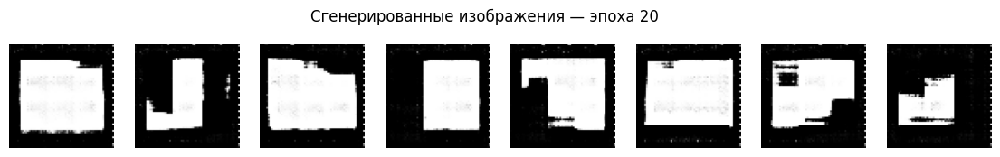

Epoch 21/40: 100%|██████████| 63/63 [00:04<00:00, 14.60it/s, loss_D=0.00894, loss_G=6.94]


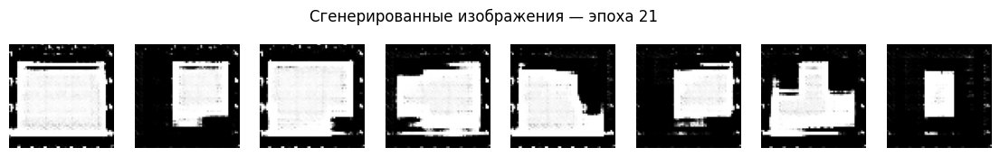

Epoch 22/40: 100%|██████████| 63/63 [00:04<00:00, 14.64it/s, loss_D=0.146, loss_G=4.79]


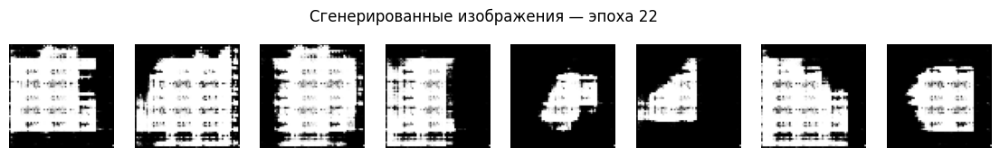

Epoch 23/40: 100%|██████████| 63/63 [00:04<00:00, 14.54it/s, loss_D=0.232, loss_G=4.33]


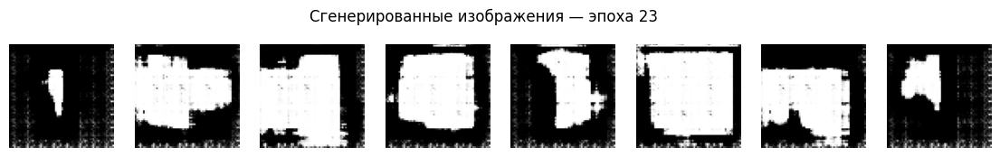

Epoch 24/40: 100%|██████████| 63/63 [00:04<00:00, 14.62it/s, loss_D=0.0177, loss_G=5.88]


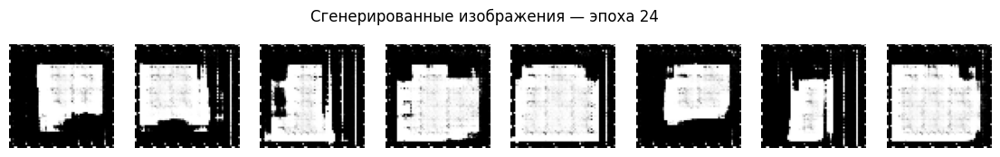

Epoch 25/40: 100%|██████████| 63/63 [00:04<00:00, 14.59it/s, loss_D=0.0102, loss_G=6.3]


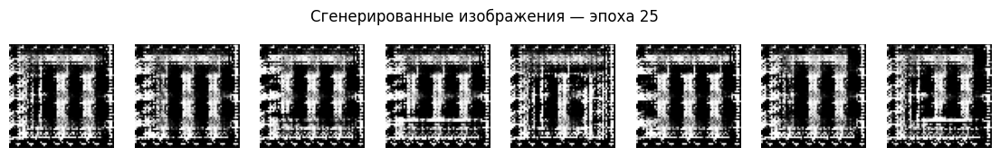

Epoch 26/40: 100%|██████████| 63/63 [00:04<00:00, 14.55it/s, loss_D=0.0081, loss_G=6.56]


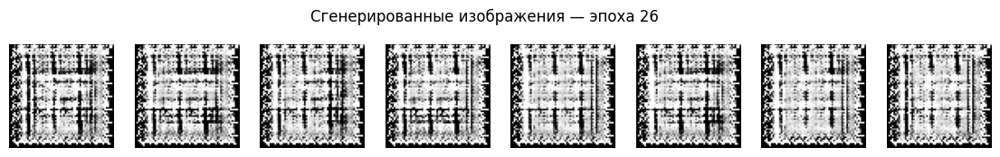

Epoch 27/40: 100%|██████████| 63/63 [00:04<00:00, 14.53it/s, loss_D=0.00143, loss_G=7.3]


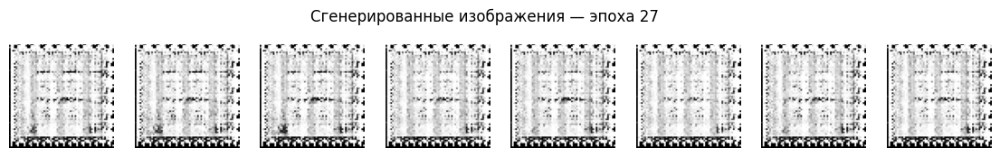

Epoch 28/40: 100%|██████████| 63/63 [00:04<00:00, 14.43it/s, loss_D=0.000522, loss_G=8.22]


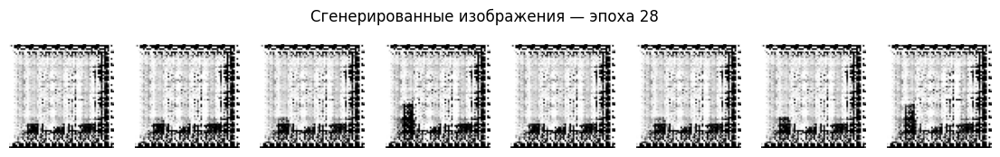

Epoch 29/40: 100%|██████████| 63/63 [00:04<00:00, 14.49it/s, loss_D=0.000316, loss_G=9.33]


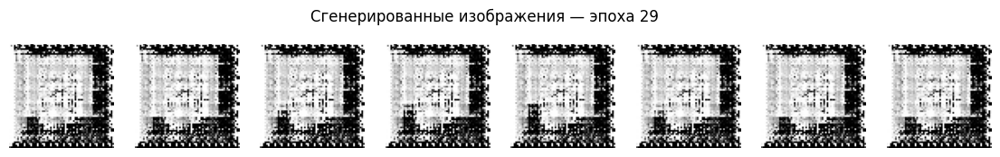

Epoch 30/40: 100%|██████████| 63/63 [00:04<00:00, 14.50it/s, loss_D=0.000369, loss_G=8.54]


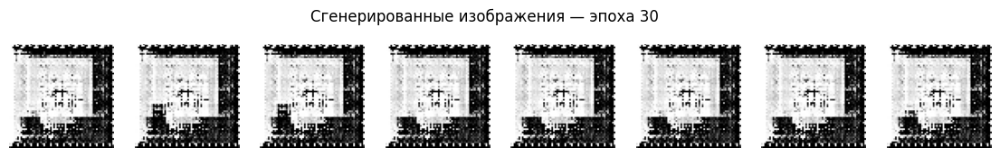

Epoch 31/40: 100%|██████████| 63/63 [00:04<00:00, 14.45it/s, loss_D=0.000441, loss_G=8.24]


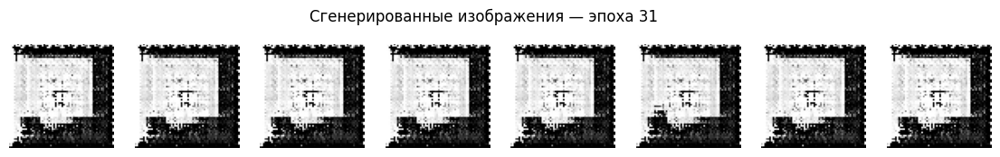

Epoch 32/40: 100%|██████████| 63/63 [00:04<00:00, 14.45it/s, loss_D=0.000137, loss_G=9.63]


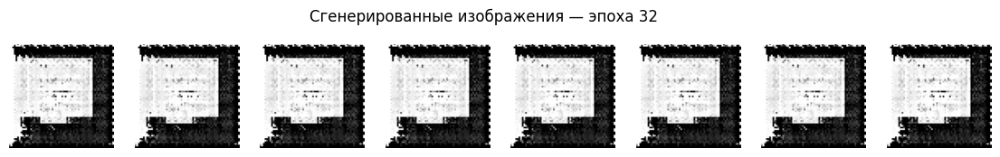

Epoch 33/40: 100%|██████████| 63/63 [00:04<00:00, 14.49it/s, loss_D=0.000174, loss_G=9.26]


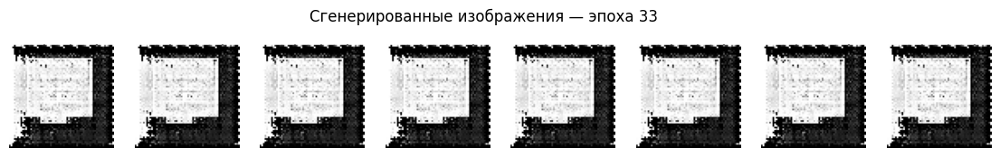

Epoch 34/40: 100%|██████████| 63/63 [00:04<00:00, 14.45it/s, loss_D=0.000445, loss_G=8.03]


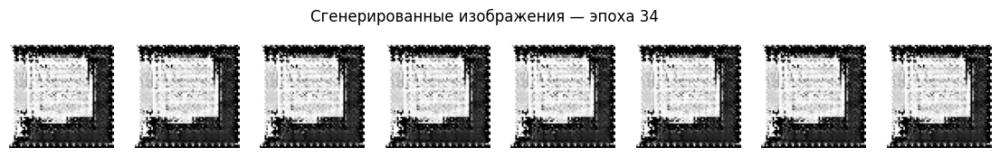

Epoch 35/40: 100%|██████████| 63/63 [00:04<00:00, 14.49it/s, loss_D=0.00763, loss_G=8.45]


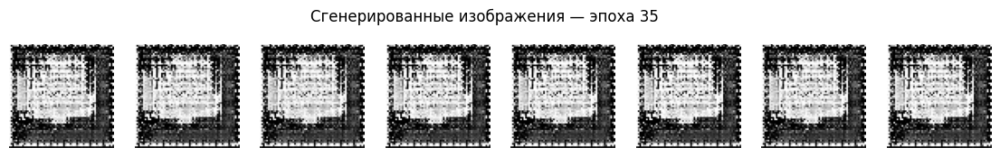

Epoch 36/40: 100%|██████████| 63/63 [00:04<00:00, 14.49it/s, loss_D=0.00298, loss_G=7.93]


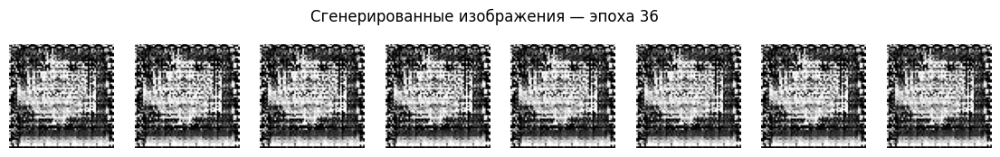

Epoch 37/40: 100%|██████████| 63/63 [00:04<00:00, 14.52it/s, loss_D=0.0019, loss_G=7.12]


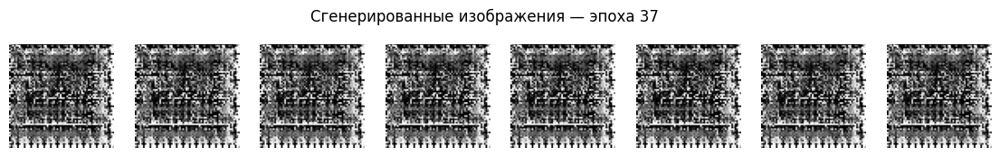

Epoch 38/40: 100%|██████████| 63/63 [00:04<00:00, 14.55it/s, loss_D=0.000564, loss_G=8.33]


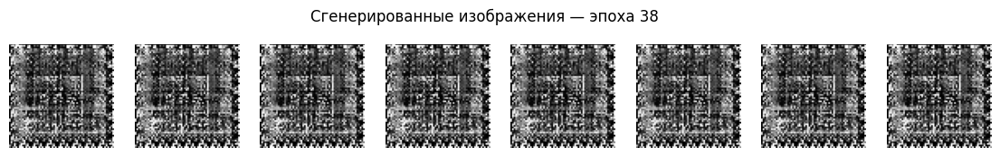

Epoch 39/40: 100%|██████████| 63/63 [00:04<00:00, 14.48it/s, loss_D=0.000799, loss_G=7.69]


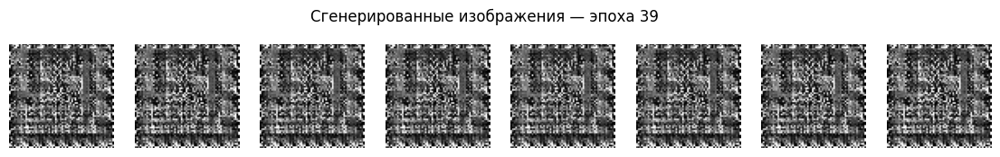

Epoch 40/40: 100%|██████████| 63/63 [00:04<00:00, 14.61it/s, loss_D=0.00029, loss_G=11]


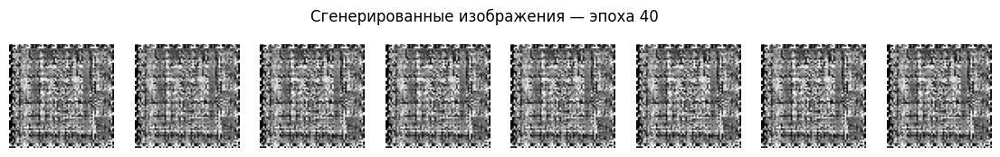

In [ ]:
EPOCHS = 40

G.train()
D.train()

for epoch in range(EPOCHS):
    pbar = tqdm(dataloader, desc=f"Epoch {epoch+1}/{EPOCHS}")

    for real_imgs in pbar:
        real_imgs = real_imgs.to(DEVICE)
        batch_size = real_imgs.size(0)

        # ---------------------
        # Обучение Discriminator
        # ---------------------
        optimizer_D.zero_grad()

        real_labels = torch.ones(batch_size, 1, device=DEVICE)
        fake_labels = torch.zeros(batch_size, 1, device=DEVICE)

        real_preds = D(real_imgs)
        loss_real = criterion(real_preds, real_labels)

        z = torch.randn(batch_size, LATENT_DIM, 1, 1, device=DEVICE)
        fake_imgs = G(z)
        fake_preds = D(fake_imgs.detach())
        loss_fake = criterion(fake_preds, fake_labels)

        loss_D = loss_real + loss_fake
        loss_D.backward()
        optimizer_D.step()

        # ---------------------
        # Обучение Generator
        # ---------------------
        optimizer_G.zero_grad()

        fake_preds = D(fake_imgs)
        loss_G = criterion(fake_preds, real_labels)
        loss_G.backward()
        optimizer_G.step()

        pbar.set_postfix({
            "loss_D": loss_D.item(),
            "loss_G": loss_G.item()
        })

    # Визуализация после каждой эпохи
    with torch.no_grad():
        z = torch.randn(8, LATENT_DIM, 1, 1, device=DEVICE)
        samples = G(z).cpu().numpy()

    fig, axes = plt.subplots(1, 8, figsize=(14, 2))
    for i in range(8):
        axes[i].imshow(samples[i, 0], cmap="gray")
        axes[i].axis("off")
    plt.suptitle(f"Сгенерированные изображения — эпоха {epoch+1}")
    plt.show()

## Валидация (качественная)

В GAN обычно нет классической валидации.
Мы оцениваем качество визуально:
* формы становятся более чёткими
* изображения похожи на обучающие

## Инференс

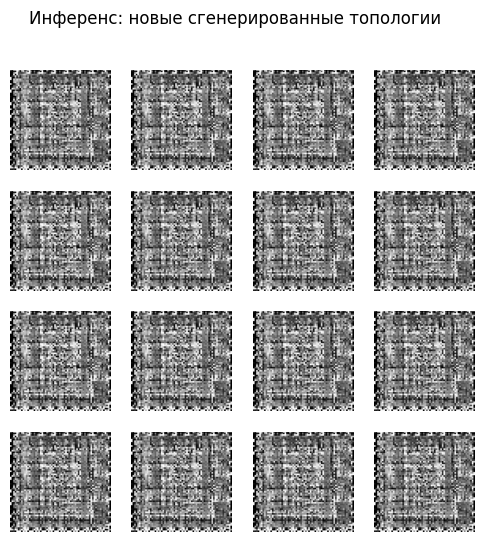

In [ ]:
G.eval()

with torch.no_grad():
    z = torch.randn(16, LATENT_DIM, 1, 1, device=DEVICE)
    generated = G(z).cpu().numpy()

fig, axes = plt.subplots(4, 4, figsize=(6, 6))
for i, ax in enumerate(axes.flat):
    ax.imshow(generated[i, 0], cmap="gray")
    ax.axis("off")
plt.suptitle("Инференс: новые сгенерированные топологии")
plt.show()

**Что мы увидели:**

1. генерируемые изображения на 20 эпохи были лучше, чем на 40-ой
2. на последних эпохах генерировался шум;
3. лосс у дискриминатора был на 4-5 порядков меньше, чем у генератора

На практике такая ситуация (1,2) называется mode-collapse (дискриминатор легко отличает сгенерированное изображение от истинного -> градиенты для G почти нулевые -> генератор теряет направление обучения).


**Вот что можно попробовать:**
1. Сократить число эпох до 20
2. Уменьшить learning rate для дискриминатора, чтобы он учился медленнее.
3. Применить label smoothing (D не становится уверенным на 100%, сохраняются градиенты для G)
4. Обновлять G чаще, чем D.

In [ ]:
criterion = nn.BCELoss()

optimizer_G = optim.Adam(G.parameters(), lr=2e-4, betas=(0.5, 0.999))
optimizer_D = optim.Adam(D.parameters(), lr=1e-4, betas=(0.5, 0.999))

Epoch 1/20: 100%|██████████| 63/63 [00:06<00:00,  9.14it/s, loss_D=1.02, loss_G=1.75]


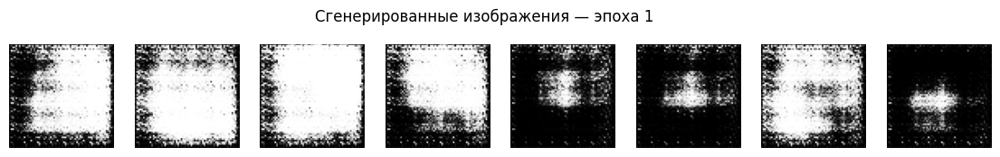

Epoch 2/20: 100%|██████████| 63/63 [00:06<00:00,  9.12it/s, loss_D=4.64, loss_G=1.65]


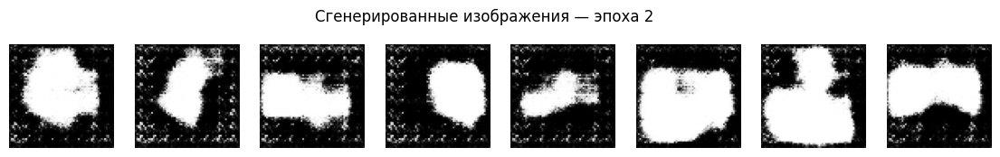

Epoch 3/20: 100%|██████████| 63/63 [00:06<00:00,  9.04it/s, loss_D=0.822, loss_G=1.61]


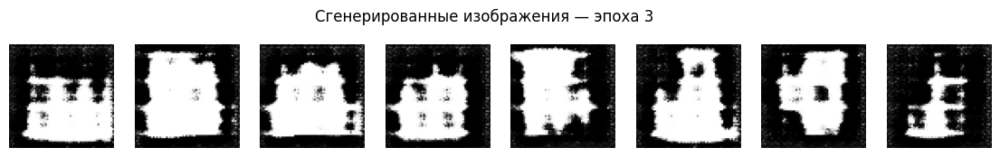

Epoch 4/20: 100%|██████████| 63/63 [00:07<00:00,  8.95it/s, loss_D=1.06, loss_G=0.989]


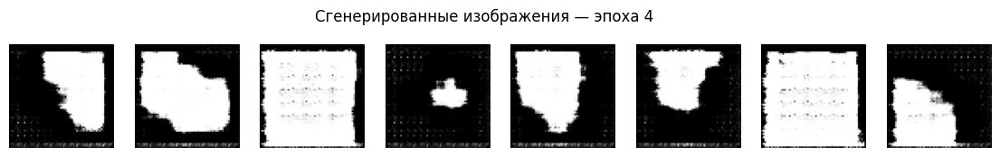

Epoch 5/20: 100%|██████████| 63/63 [00:07<00:00,  8.90it/s, loss_D=0.611, loss_G=1.91]


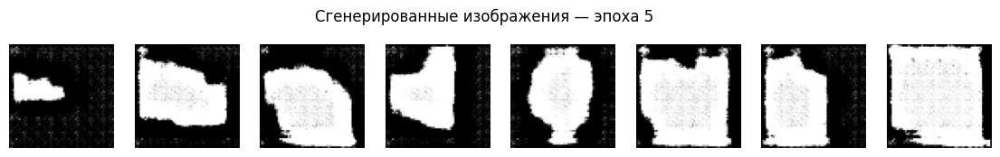

Epoch 6/20: 100%|██████████| 63/63 [00:07<00:00,  8.83it/s, loss_D=0.591, loss_G=3.19]


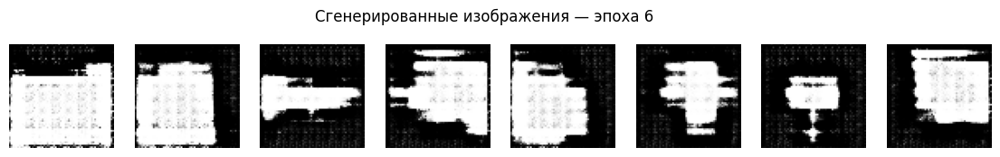

Epoch 7/20: 100%|██████████| 63/63 [00:07<00:00,  8.78it/s, loss_D=0.474, loss_G=2.8]


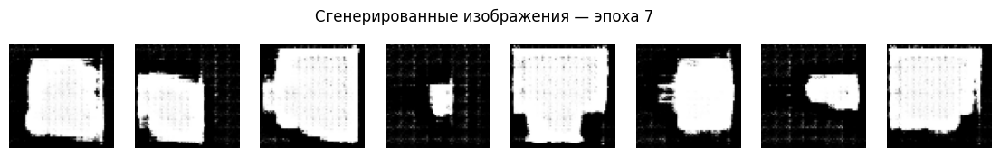

Epoch 8/20: 100%|██████████| 63/63 [00:07<00:00,  8.75it/s, loss_D=0.559, loss_G=3.04]


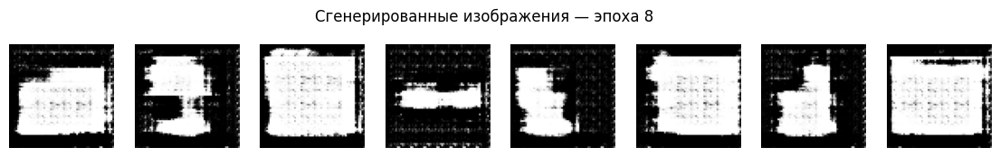

Epoch 9/20: 100%|██████████| 63/63 [00:07<00:00,  8.78it/s, loss_D=0.444, loss_G=4.08]


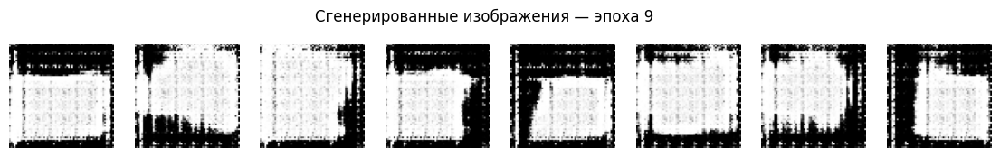

Epoch 10/20: 100%|██████████| 63/63 [00:07<00:00,  8.85it/s, loss_D=0.452, loss_G=2.45]


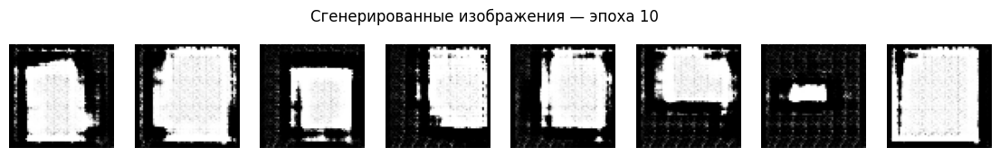

Epoch 11/20: 100%|██████████| 63/63 [00:07<00:00,  8.89it/s, loss_D=2.16, loss_G=0.409]


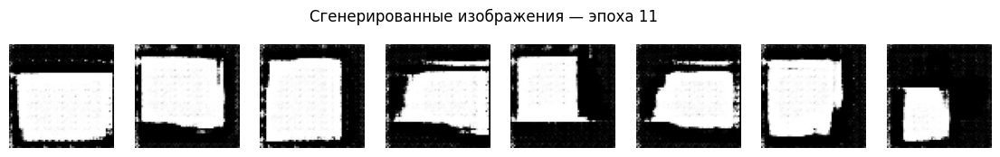

Epoch 12/20: 100%|██████████| 63/63 [00:07<00:00,  8.91it/s, loss_D=0.994, loss_G=3]


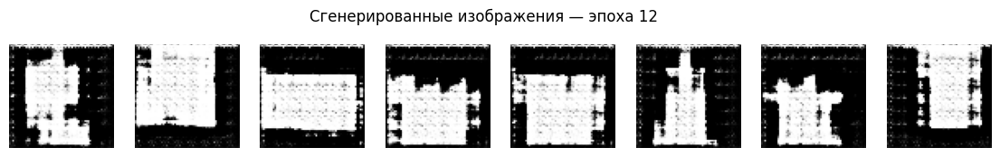

Epoch 13/20: 100%|██████████| 63/63 [00:07<00:00,  8.94it/s, loss_D=0.431, loss_G=3.65]


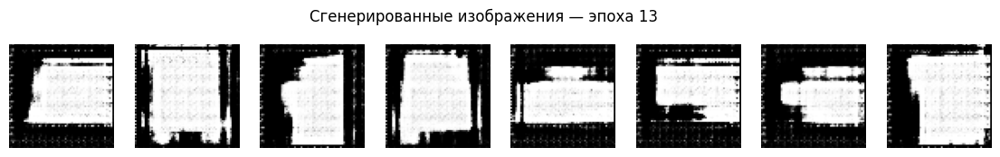

Epoch 14/20: 100%|██████████| 63/63 [00:07<00:00,  8.95it/s, loss_D=0.405, loss_G=3.03]


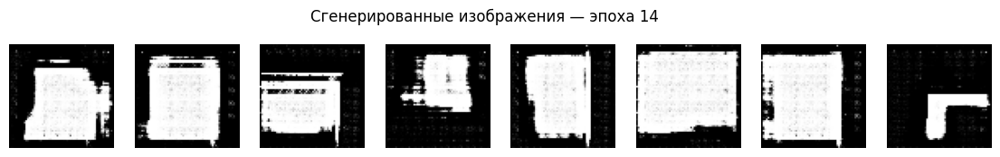

Epoch 15/20: 100%|██████████| 63/63 [00:07<00:00,  8.94it/s, loss_D=0.629, loss_G=4.46]


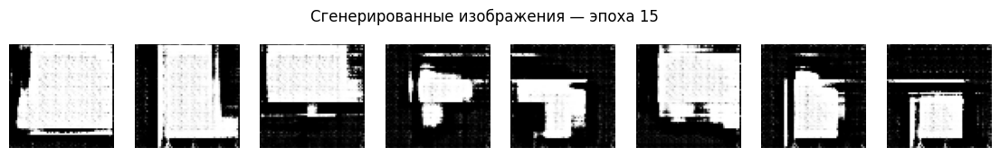

Epoch 16/20: 100%|██████████| 63/63 [00:07<00:00,  8.91it/s, loss_D=0.822, loss_G=1.87]


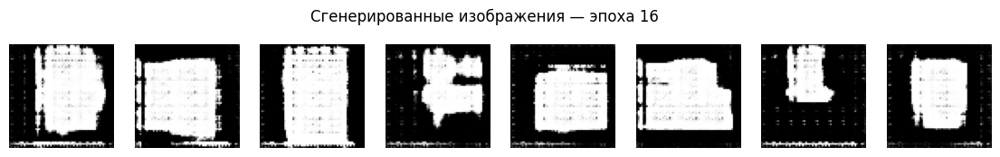

Epoch 17/20: 100%|██████████| 63/63 [00:07<00:00,  8.88it/s, loss_D=0.457, loss_G=1.68]


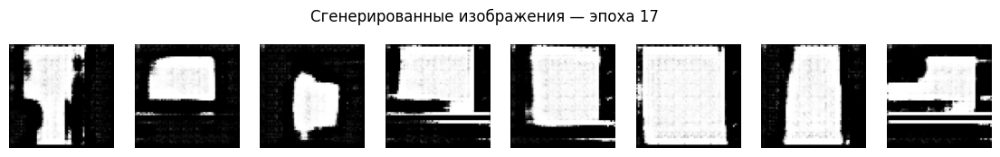

Epoch 18/20: 100%|██████████| 63/63 [00:07<00:00,  8.84it/s, loss_D=0.359, loss_G=4.11]


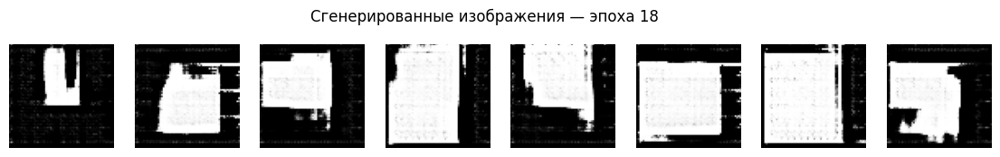

Epoch 19/20: 100%|██████████| 63/63 [00:07<00:00,  8.87it/s, loss_D=0.691, loss_G=2.61]


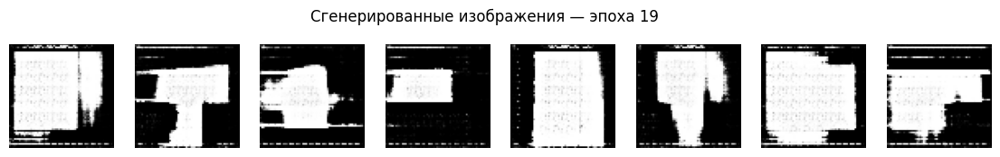

Epoch 20/20: 100%|██████████| 63/63 [00:07<00:00,  8.84it/s, loss_D=0.387, loss_G=3.97]


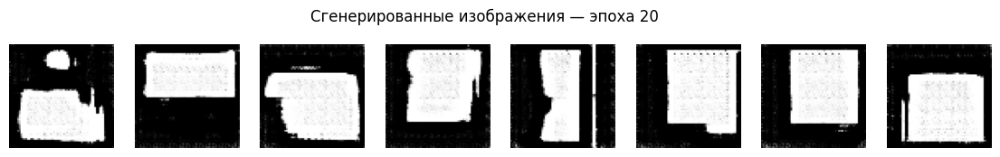

In [ ]:
EPOCHS = 20

G.train()
D.train()

for epoch in range(EPOCHS):
    pbar = tqdm(dataloader, desc=f"Epoch {epoch+1}/{EPOCHS}")

    for real_imgs in pbar:
        real_imgs = real_imgs.to(DEVICE)
        batch_size = real_imgs.size(0)

        # ---------------------
        # Обучение Discriminator
        # ---------------------
        optimizer_D.zero_grad()

        real_labels = torch.full((batch_size,1), 0.9).to(DEVICE) #torch.ones(batch_size, 1, device=DEVICE)
        fake_labels = torch.zeros(batch_size, 1, device=DEVICE)

        real_preds = D(real_imgs)
        loss_real = criterion(real_preds, real_labels)

        z = torch.randn(batch_size, LATENT_DIM, 1, 1, device=DEVICE)
        fake_imgs = G(z)
        fake_preds = D(fake_imgs.detach())
        loss_fake = criterion(fake_preds, fake_labels)

        loss_D = loss_real + loss_fake
        loss_D.backward()
        optimizer_D.step()

        # ---------------------
        # Обучение Generator, обновляем веса в 2 раза чаще
        # ---------------------

        for _ in range(2):
          optimizer_G.zero_grad()

          z = torch.randn(batch_size, LATENT_DIM, 1, 1, device=DEVICE)
          fake_imgs = G(z)
          fake_preds = D(fake_imgs)

          loss_G = criterion(fake_preds, real_labels)
          loss_G.backward()
          optimizer_G.step()

        pbar.set_postfix({
            "loss_D": loss_D.item(),
            "loss_G": loss_G.item()
        })

    # Визуализация после каждой эпохи
    with torch.no_grad():
        z = torch.randn(8, LATENT_DIM, 1, 1, device=DEVICE)
        samples = G(z).cpu().numpy()

    fig, axes = plt.subplots(1, 8, figsize=(14, 2))
    for i in range(8):
        axes[i].imshow(samples[i, 0], cmap="gray")
        axes[i].axis("off")
    plt.suptitle(f"Сгенерированные изображения — эпоха {epoch+1}")
    plt.show()

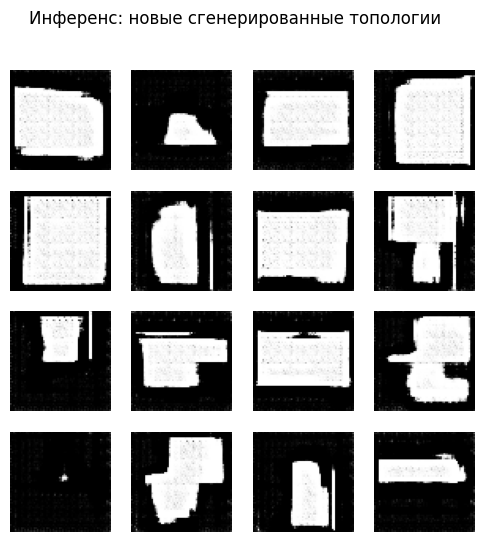

In [ ]:
G.eval()

with torch.no_grad():
    z = torch.randn(16, LATENT_DIM, 1, 1, device=DEVICE)
    generated = G(z).cpu().numpy()

fig, axes = plt.subplots(4, 4, figsize=(6, 6))
for i, ax in enumerate(axes.flat):
    ax.imshow(generated[i, 0], cmap="gray")
    ax.axis("off")
plt.suptitle("Инференс: новые сгенерированные топологии")
plt.show()

Картинки очень далеки от идеала, но визуально стало гораздо лучше.

На практике чаще пользуются более современными архитектурами, типа StyleGAN и т.п.

## Итог:
* Мы обучили DCGAN
* Использовали синтетический датасет из домена микроэлектроники
* Увидели, как Generator учится воспроизводить структуру данных
